In [1]:
import scanpy as sc
import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

In [2]:
nanostring_dir = Path().resolve() 
sample_dir = nanostring_dir 

In [3]:
sample_dir

PosixPath('/beegfs/scratch/ric.cosr/ric.cosr/DellabonaP/CosMX/5_Raw_data/R5630_Slide2')

In [4]:
#load slide 2 object

In [5]:
adata = sq.read.nanostring(
    path=sample_dir,
    counts_file="R5630_Slide2_exprMat_file.csv",
    meta_file="R5630_Slide2_metadata_file.csv",
    fov_file="R5630_Slide2_fov_positions_file.csv",
)

In [6]:
adata_seurat = sc.read_h5ad("../../CosMx.h5ad")

In [7]:
adata_seurat.shape

(108946, 978)

In [8]:
adata_seurat.obs

,orig.ident,nCount_Nanostring,nFeature_Nanostring,cell_ID,fov,Area,AspectRatio,Width,Height,Mean.CD298,...,tissue,Run_Slide_name,slide_ID_numeric,Run_Tissue_name,log10totalcounts,IFcolor,nb_clus,leiden_clus,nclust,id
R5630.Slide2_1_1,SeuratProject,95.0,57,c_2_1_1,1,3467,1.10,75,68,119,...,Slide2,R5630_S2,2,R5630_Slide2,1.977724,#768378FF,e,4.0,niche4,R5630.Slide2_1_1
R5630.Slide2_2_1,SeuratProject,74.0,52,c_2_1_2,1,3122,1.27,76,60,109,...,Slide2,R5630_S2,2,R5630_Slide2,1.869232,#C88A9CFF,e,4.0,niche4,R5630.Slide2_2_1
R5630.Slide2_3_1,SeuratProject,42.0,29,c_2_1_3,1,1600,1.28,55,43,126,...,Slide2,R5630_S2,2,R5630_Slide2,1.623249,#6D8E6AFF,e,4.0,niche4,R5630.Slide2_3_1
R5630.Slide2_4_1,SeuratProject,115.0,67,c_2_1_4,1,3546,0.80,69,86,161,...,Slide2,R5630_S2,2,R5630_Slide2,2.060698,#FFC3A6FF,e,4.0,niche4,R5630.Slide2_4_1
R5630.Slide2_5_1,SeuratProject,98.0,62,c_2_1_5,1,3266,1.11,80,72,90,...,Slide2,R5630_S2,2,R5630_Slide2,1.982271,#CE758AFF,e,4.0,niche4,R5630.Slide2_5_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R5630.Slide4_3681_10,SeuratProject,38.0,30,c_1_10_3681,10,2427,1.45,71,49,160,...,Slide4,R5630_S1,1,R5630_Slide4,1.579784,#43DF0EFF,d,1.0,niche1,R5630.Slide4_3681_10
R5630.Slide4_3682_10,SeuratProject,29.0,23,c_1_10_3682,10,1629,0.96,46,48,251,...,Slide4,R5630_S1,1,R5630_Slide4,1.462398,#67FF20FF,d,10.0,niche1,R5630.Slide4_3682_10
R5630.Slide4_3683_10,SeuratProject,67.0,46,c_1_10_3683,10,2632,2.21,86,39,316,...,Slide4,R5630_S1,1,R5630_Slide4,1.826075,#40FF0BFF,d,10.0,niche1,R5630.Slide4_3683_10
R5630.Slide4_3687_10,SeuratProject,31.0,25,c_1_10_3687,10,1680,2.09,69,33,115,...,Slide4,R5630_S1,1,R5630_Slide4,1.491362,#3DFF19FF,d,1.0,niche1,R5630.Slide4_3687_10


In [9]:
adata_seurat.obs["fov"]

R5630.Slide2_1_1         1
R5630.Slide2_2_1         1
R5630.Slide2_3_1         1
R5630.Slide2_4_1         1
R5630.Slide2_5_1         1
                        ..
R5630.Slide4_3681_10    10
R5630.Slide4_3682_10    10
R5630.Slide4_3683_10    10
R5630.Slide4_3687_10    10
R5630.Slide4_3688_10    10
Name: fov, Length: 108946, dtype: int32

In [10]:
adata_seurat_2 = adata_seurat[adata_seurat.obs["tissue"] == "Slide2"]

In [11]:
# https://scanpy.readthedocs.io/en/stable/usage-principles.html

In [12]:
#get gene names
adata_seurat_2.var_names

Index(['ABL1', 'ABL2', 'ACE', 'ACE2', 'ACKR1', 'ACKR3', 'ACKR4', 'ACTA2',
       'ACTG2', 'ACVR1',
       ...
       'NegPrb13', 'NegPrb14', 'NegPrb15', 'NegPrb16', 'NegPrb18', 'NegPrb19',
       'NegPrb20', 'NegPrb21', 'NegPrb22', 'NegPrb23'],
      dtype='object', length=978)

In [13]:
#get cell IDS
adata.obs_names

Index(['1_1', '2_1', '3_1', '4_1', '5_1', '6_1', '7_1', '8_1', '9_1', '10_1',
       ...
       '3825_11', '3826_11', '3827_11', '3828_11', '3829_11', '3830_11',
       '3831_11', '3832_11', '3833_11', '3834_11'],
      dtype='object', length=48146)

In [14]:
#Make the variable names unique using the method anndata.var_names_make_unique. 
#Obtain the mitochondrial genes using their names prefixed with “mt-”. 
#Calculate the quality control metrics on the anndata.AnnData 
#using scanpy.pp.calculate_qc_metrics.

In [15]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [16]:
adata.shape

(48146, 979)

In [23]:
len(set(adata.obs.cell_ID))

7294

In [31]:
adata.obs["Idents"] =  adata.obs_names

In [27]:
adata.obs.index.values[2]

'3_1'

In [18]:
# subset Scanpy adata object based on Seurat Cell IDs

In [32]:
# get rownames adata
adata.obs_names

Index(['1_1', '2_1', '3_1', '4_1', '5_1', '6_1', '7_1', '8_1', '9_1', '10_1',
       ...
       '3825_11', '3826_11', '3827_11', '3828_11', '3829_11', '3830_11',
       '3831_11', '3832_11', '3833_11', '3834_11'],
      dtype='object', length=48146)

In [34]:
len(set(adata.obs.Idents))

48146

In [35]:
adata_seurat_2.obs_names

Index(['R5630.Slide2_1_1', 'R5630.Slide2_2_1', 'R5630.Slide2_3_1',
       'R5630.Slide2_4_1', 'R5630.Slide2_5_1', 'R5630.Slide2_6_1',
       'R5630.Slide2_7_1', 'R5630.Slide2_8_1', 'R5630.Slide2_9_1',
       'R5630.Slide2_11_1',
       ...
       'R5630.Slide2_3815_11', 'R5630.Slide2_3816_11', 'R5630.Slide2_3817_11',
       'R5630.Slide2_3818_11', 'R5630.Slide2_3819_11', 'R5630.Slide2_3820_11',
       'R5630.Slide2_3822_11', 'R5630.Slide2_3823_11', 'R5630.Slide2_3824_11',
       'R5630.Slide2_3826_11'],
      dtype='object', length=40288)

In [20]:
adata_seurat_2.obs["temp_1"] = adata_seurat_2.obs.cell_ID.str.split('_').str[-1]

/beegfs/scratch/tmp/ipykernel_17274/4076467334.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_seurat_2.obs["temp_1"] = adata_seurat_2.obs.cell_ID.str.split('_').str[-1]


In [36]:
adata_seurat_2.obs["temp_2"] = adata_seurat_2.obs.cell_ID.str.split('_').str[-2]

In [38]:
adata_seurat_2.obs["temp_3"] = adata_seurat_2.obs["temp_1"].astype(str) +"_"+ adata_seurat_2.obs["temp_2"]

In [40]:
len(set(adata_seurat_2.obs.temp_3))

40288

In [41]:
adata_sub = adata[adata.obs.Idents.isin(adata_seurat_2.obs.temp_3),:]

In [ ]:
df[~df["column"].isin(["value"])]

In [44]:
adata_not_sub = adata[~adata.obs.Idents.isin(adata_seurat_2.obs.temp_3),:]

In [46]:
len(set(adata_not_sub.obs.Idents))

7858

In [42]:
len(set(adata_sub.obs.Idents))

40288

In [48]:
max(adata_not_sub.obs.total_counts)

1566

In [49]:
min(adata_not_sub.obs.total_counts)

0

In [50]:
max(adata_sub.obs.total_counts)

1470

In [51]:
min(adata_sub.obs.total_counts)

20

In [79]:
adata_not_sub.obs.min(numeric_only=True)

Area                               60.000000
AspectRatio                         0.310000
CenterX_global_px             -109484.857143
CenterY_global_px              -37255.000000
Width                              11.000000
Height                              8.000000
Mean.MembraneStain                  0.000000
Max.MembraneStain                  21.000000
Mean.PanCK                          1.000000
Max.PanCK                          24.000000
Mean.CD68                           2.000000
Max.CD68                           32.000000
Mean.CD3                            0.000000
Max.CD3                            13.000000
Mean.DAPI                           7.000000
Max.DAPI                           37.000000
cell_ID                             1.000000
n_genes_by_counts                   0.000000
log1p_n_genes_by_counts             0.000000
total_counts                        0.000000
log1p_total_counts                  0.000000
pct_counts_in_top_50_genes         55.854127
pct_counts

In [80]:
adata_sub.obs.min(numeric_only=True)

Area                              269.000000
AspectRatio                         0.260000
CenterX_global_px             -109502.857143
CenterY_global_px              -37361.000000
Width                              16.000000
Height                             12.000000
Mean.MembraneStain                  1.000000
Max.MembraneStain                  39.000000
Mean.PanCK                          2.000000
Max.PanCK                          28.000000
Mean.CD68                           3.000000
Max.CD68                           40.000000
Mean.CD3                            0.000000
Max.CD3                            27.000000
Mean.DAPI                           2.000000
Max.DAPI                           43.000000
cell_ID                             1.000000
n_genes_by_counts                   3.000000
log1p_n_genes_by_counts             1.386294
total_counts                       20.000000
log1p_total_counts                  3.044522
pct_counts_in_top_50_genes         40.760870
pct_counts

In [55]:
uni = adata_not_sub.obs.total_counts.unique()
print(sorted(uni))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 60, 75, 374, 390, 501, 521, 540, 545, 560, 607, 612, 657, 682, 708, 749, 753, 754, 758, 767, 773, 804, 817, 843, 895, 952, 967, 1013, 1016, 1021, 1037, 1102, 1110, 1142, 1155, 1188, 1208, 1212, 1236, 1240, 1250, 1292, 1294, 1303, 1418, 1427, 1566]


In [59]:
nuni = adata_not_sub.obs.total_counts.nunique()
nuni

70

In [67]:
adata_not_sub.obs.groupby('total_counts')['total_counts'].nunique()

<bound method NDFrame.head of total_counts
0       1
1       1
2       1
3       1
4       1
       ..
1294    1
1303    1
1418    1
1427    1
1566    1
Name: total_counts, Length: 70, dtype: int64>

In [69]:
check = adata_not_sub.obs.loc[adata_not_sub.obs['total_counts'] == 1566]

In [75]:
check['Max.PanCK']

784_7    2493
Name: Max.PanCK, dtype: int64

In [43]:
adata_sub

View of AnnData object with n_obs × n_vars = 40288 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68', 'Max.CD68', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'Idents'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [52]:
adata_sub.obs

,fov,Area,AspectRatio,CenterX_global_px,CenterY_global_px,Width,Height,Mean.MembraneStain,Max.MembraneStain,Mean.PanCK,...,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,Idents
1_1,1,3467,1.10,-106239.857143,26280.333333,75,68,119,363,74,...,95,4.564348,92.631579,100.0,100.0,100.0,0,0.0,0.0,1_1
2_1,1,3122,1.27,-106192.857143,26284.333333,76,60,109,420,78,...,74,4.317488,97.297297,100.0,100.0,100.0,0,0.0,0.0,2_1
3_1,1,1600,1.28,-106091.857143,26292.333333,55,43,126,403,80,...,42,3.761200,100.000000,100.0,100.0,100.0,0,0.0,0.0,3_1
4_1,1,3546,0.80,-106060.857143,26271.333333,69,86,161,544,110,...,115,4.753590,85.217391,100.0,100.0,100.0,0,0.0,0.0,4_1
5_1,1,3266,1.11,-105875.857143,26278.333333,80,72,90,347,66,...,98,4.595120,87.755102,100.0,100.0,100.0,0,0.0,0.0,5_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3820_11,11,3373,0.87,-92285.047619,-28253.666667,65,75,76,252,72,...,90,4.510860,86.666667,100.0,100.0,100.0,0,0.0,0.0,3820_11
3822_11,11,1184,0.60,-92402.047619,-28258.666667,35,58,48,180,13,...,44,3.806662,100.000000,100.0,100.0,100.0,0,0.0,0.0,3822_11
3823_11,11,1932,1.39,-93301.047619,-28267.666667,64,46,185,467,57,...,26,3.295837,100.000000,100.0,100.0,100.0,0,0.0,0.0,3823_11
3824_11,11,1545,1.29,-92839.047619,-28269.666667,54,42,148,604,40,...,69,4.248495,100.000000,100.0,100.0,100.0,0,0.0,0.0,3824_11


In [38]:
set_to_keep = set(adata_seurat_2.obs.temp_1)

In [43]:
test = set(adata.obs.cell_ID)

In [40]:
len(set_to_keep)

6911

In [44]:
len(test)

7294

In [47]:
adata_seurat_2.shape

(40288, 978)

In [48]:
adata.obs.cell_ID

1_1           1
2_1           2
3_1           3
4_1           4
5_1           5
           ... 
3830_11    3830
3831_11    3831
3832_11    3832
3833_11    3833
3834_11    3834
Name: cell_ID, Length: 48146, dtype: int64

In [41]:
adata_seurat_2.obs.temp_1

R5630.Slide2_1_1           1
R5630.Slide2_2_1           2
R5630.Slide2_3_1           3
R5630.Slide2_4_1           4
R5630.Slide2_5_1           5
                        ... 
R5630.Slide2_3820_11    3820
R5630.Slide2_3822_11    3822
R5630.Slide2_3823_11    3823
R5630.Slide2_3824_11    3824
R5630.Slide2_3826_11    3826
Name: temp_1, Length: 40288, dtype: object

Plot the “total_counts” and “n_genes_by_counts” from adata.obs. The first subplot shows adata.obs["total_counts"], the second adata.obs["total_counts"] less than 10000. The third subplot displays adata.obs["n_genes_by_counts"] while the fourth displays the adata.obs["n_genes_by_counts"] less than 4000.

/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)


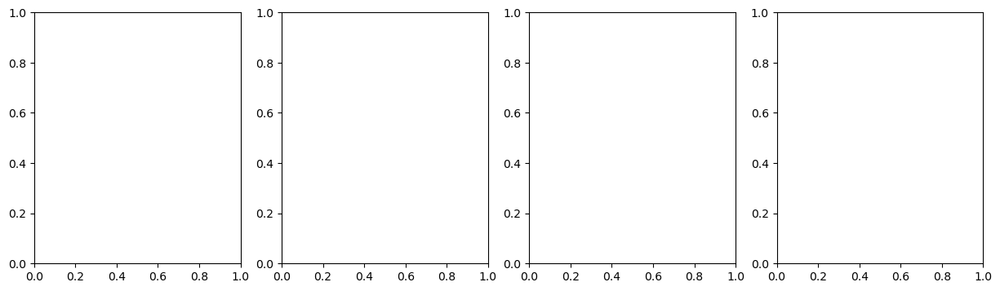

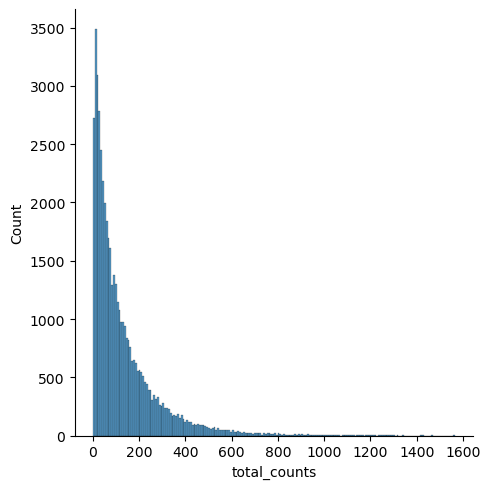

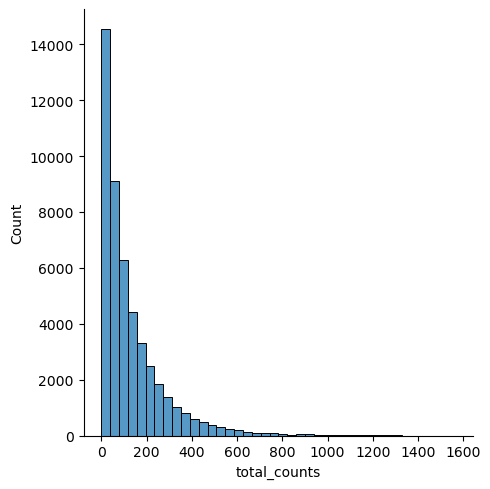

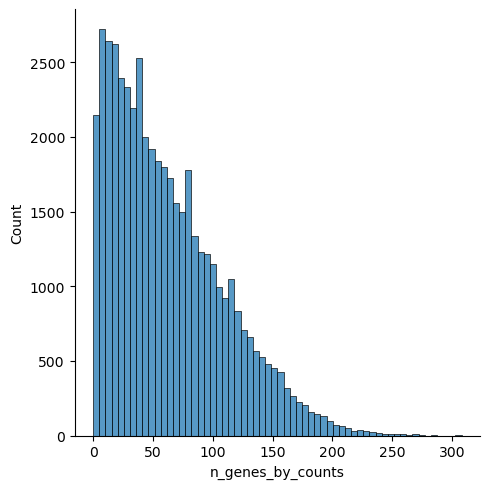

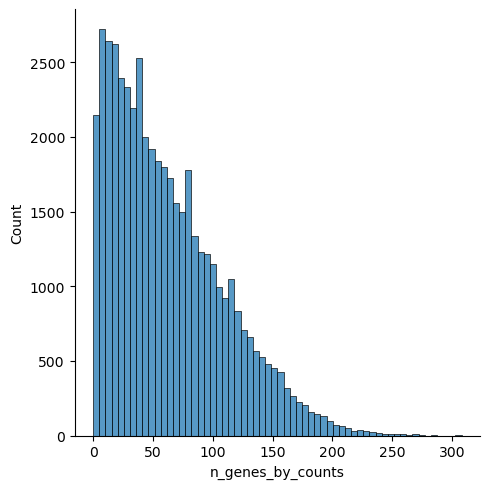

In [8]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.displot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)
sns.displot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.displot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    bins=60,
    ax=axs[2],
)
sns.displot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

Filter the cells based on the minimum number of counts required using scanpy.pp.filter_cells. Filter the genes based on the minimum number of cells required with scanpy.pp.filter_genes. The parameters for both were specified based on the plots above. They were set to filter out nearly 10% of the cells and genes with minimum counts and minimum cells respectively. It’s a conservative filtering, more relaxed ones could be also useful.

In [8]:
sc.pp.filter_cells(adata, min_counts=100)
sc.pp.filter_genes(adata, min_cells=400)

Annotate the highly variable genes based on the count data by using scanpy.pp.highly_variable_genes with flavor="seurat_v3". Normalize counts per cell using scanpy.pp.normalize_total.

Logarithmize, do principal component analysis, compute a neighborhood graph of the observations using scanpy.pp.log1p, scanpy.pp.pca and scanpy.pp.neighbors respectively.

Use scanpy.tl.umap to embed the neighborhood graph of the data and cluster the cells into subgroups employing scanpy.tl.leiden.

You may have to install scikit-misc package for highly variable genes identification.



In [9]:
adata.layers["counts"] = adata.X.copy()
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=4000)
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


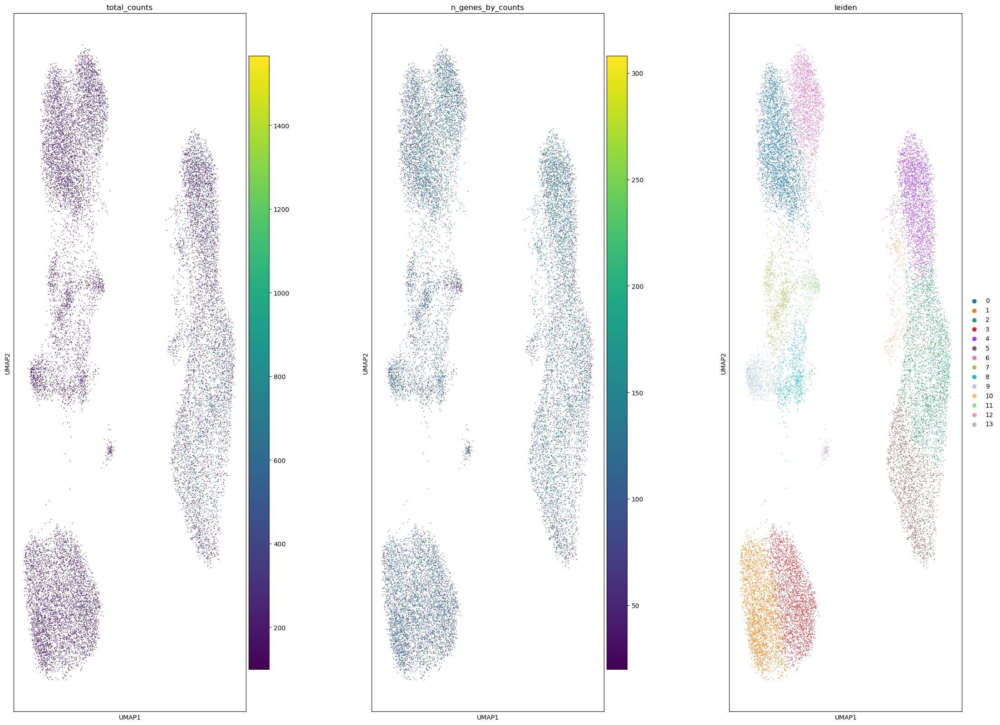

In [10]:
sc.pl.umap(
    adata,
    color=[
        "total_counts",
        "n_genes_by_counts",
        "leiden",
    ],
    wspace=0.4,
)

Visualize annotation on UMAP and spatial coordinates

Subplot with scatter plot in UMAP (Uniform Manifold Approximation and Projection) basis. The embedded points were colored, respectively, according to the total counts, number of genes by counts and leiden clusters in each of the subplots. This gives us some idea of what the data looks like.

In [11]:
adata.obs["fov"]

4_1         1
8_1         1
14_1        1
16_1        1
17_1        1
           ..
3804_11    11
3808_11    11
3811_11    11
3814_11    11
3826_11    11
Name: fov, Length: 20810, dtype: category
Categories (11, object): ['1', '10', '11', '2', ..., '6', '7', '8', '9']

In [12]:
set(adata.obs["fov"])

{'1', '10', '11', '2', '3', '4', '5', '6', '7', '8', '9'}

In [17]:
print("in this slide are present", len(set(adata.obs["fov"])), "FOVs")

in this slide are present 11 FOVs


Plot segmentation masks using squidpy.pl.spatial_segment. Specifically, the key library_id in adata.obs contains the same unique values contained in adata.uns["spatial"]. The "cell_ID" column is used to spot individual cells. Here, the images were colored in accordance with the intensity of the maximum pan-cytokeratin (CK) staining.

In [18]:
adata.obs.head

<bound method NDFrame.head of         fov  Area  AspectRatio  CenterX_global_px  CenterY_global_px  Width   
4_1       1  3546         0.80     -106060.857143       26271.333333     69  \
8_1       1  3035         1.08     -105898.857143       26269.333333     79   
14_1      1  3160         0.94     -106127.857143       26221.333333     67   
16_1      1  3010         0.84     -105881.857143       26206.333333     67   
17_1      1  3371         1.64     -106012.857143       26203.333333     82   
...      ..   ...          ...                ...                ...    ...   
3804_11  11  2584         0.90      -93047.047619      -28035.666667     57   
3808_11  11  2378         0.82      -91900.047619      -28057.666667     56   
3811_11  11  3233         0.91      -91786.047619      -28082.666667     63   
3814_11  11  2256         0.90      -93273.047619      -28169.666667     56   
3826_11  11  2372         1.74      -91842.047619      -28269.666667     75   

         Height  Mean

In [13]:
adata.obsm

AxisArrays with keys: spatial, spatial_fov

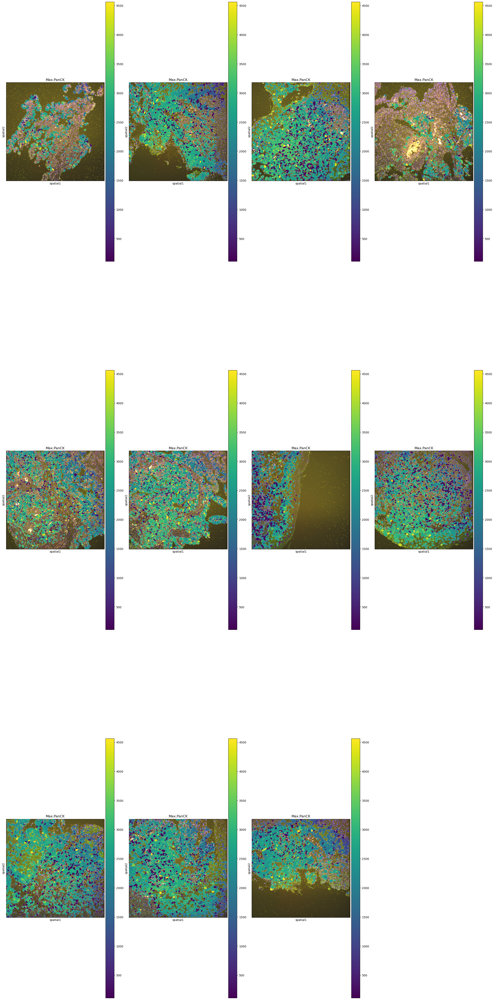

In [33]:
sq.pl.spatial_segment(
    adata,
    color="Max.PanCK",
    library_key="fov",
    seg_cell_id="cell_ID",
)

The argument library_id can also be altered to obtain specific field(s) of view.

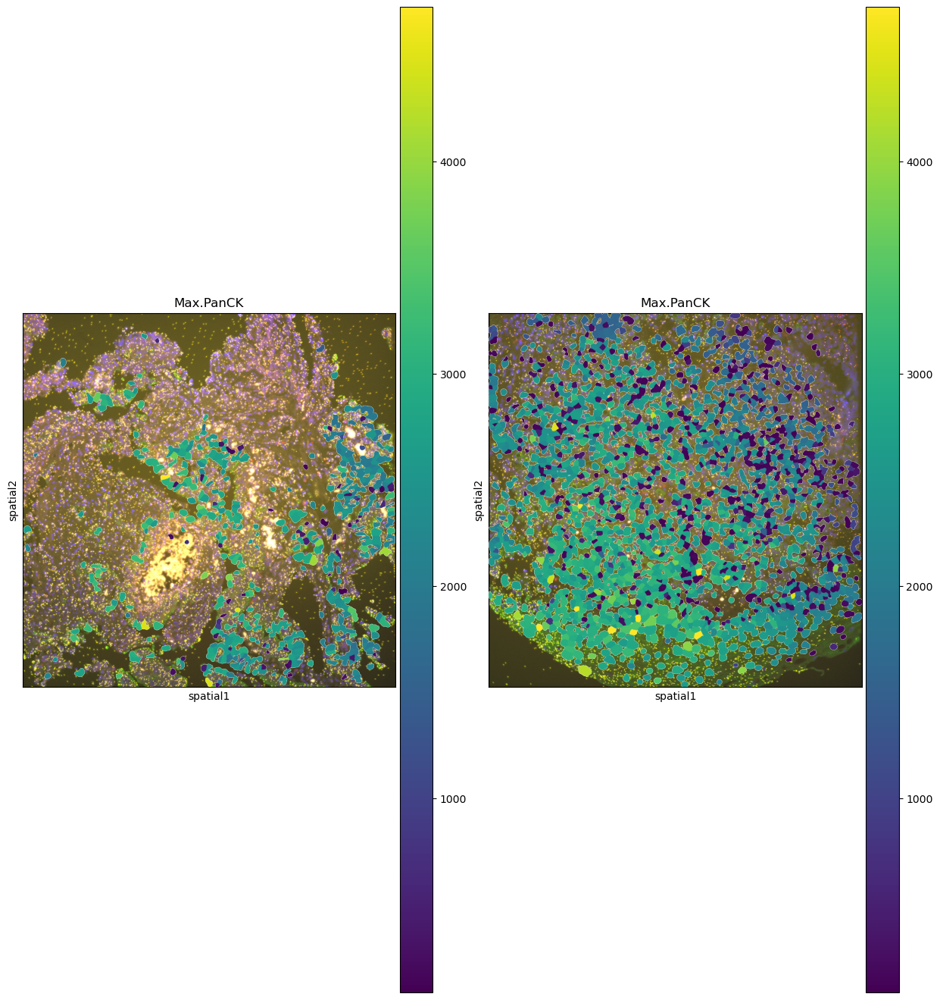

In [31]:
sq.pl.spatial_segment(
    adata,
    color="Max.PanCK",
    library_key="fov",
    library_id=["2", "6"],
    seg_cell_id="cell_ID"
)



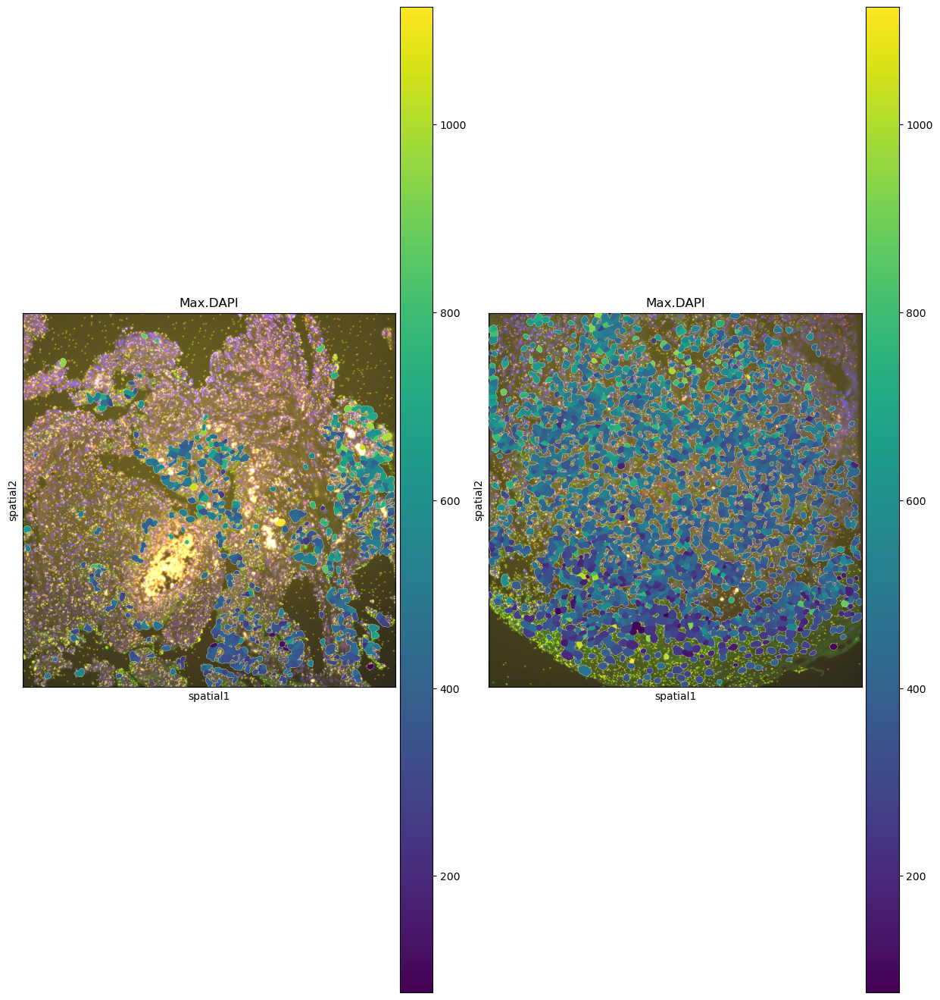

In [34]:
sq.pl.spatial_segment(
    adata,
    color="Max.DAPI",
    library_key="fov",
    library_id=["2", "6"],
    seg_cell_id="cell_ID"
)



/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/seaborn/distributions.py:2142: UserWarning: `displot` is a figure-level function and does not accept the ax= parameter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)


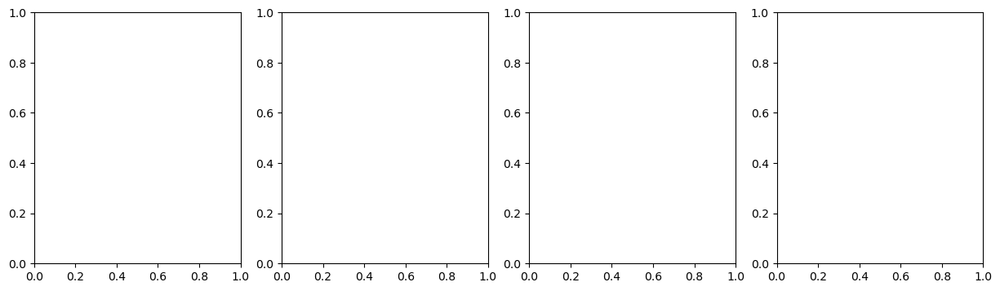

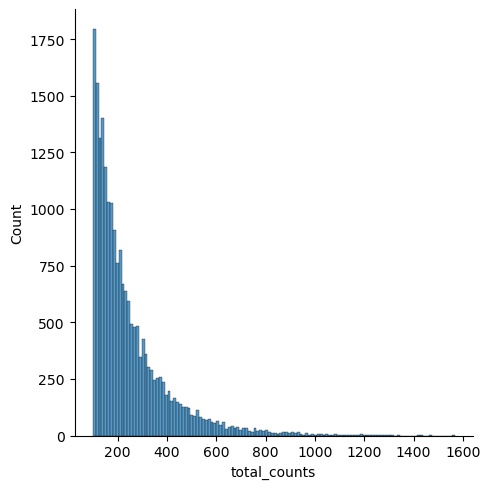

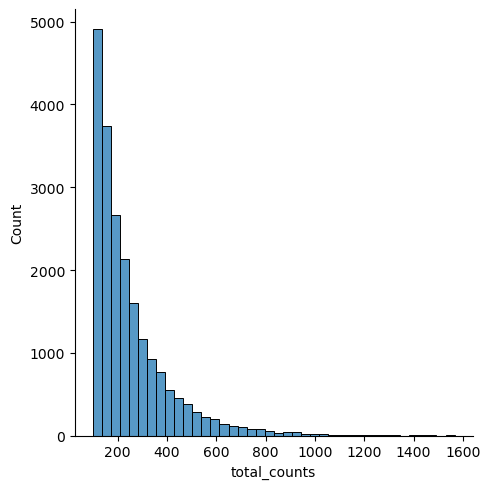

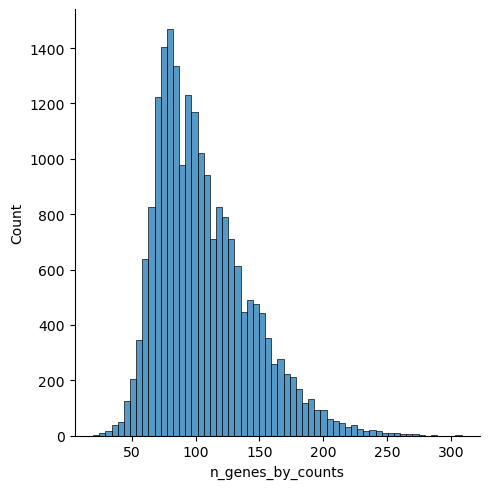

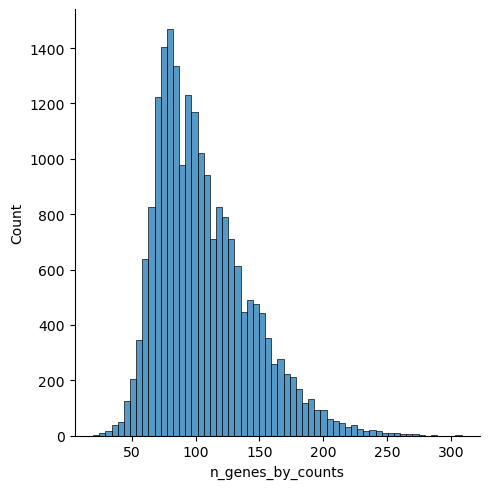

In [29]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.displot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)
sns.displot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.displot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    bins=60,
    ax=axs[2],
)
sns.displot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

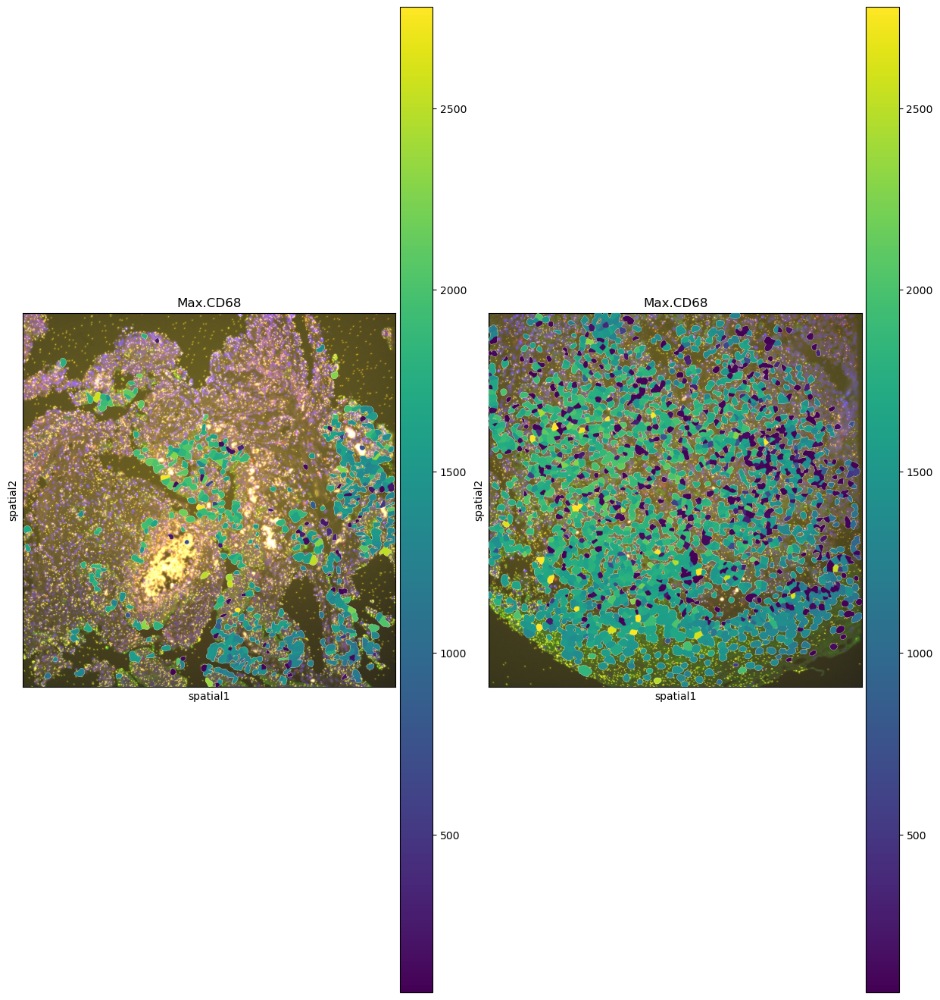

In [36]:
sq.pl.spatial_segment(
    adata,
    color="Max.CD68",
    library_key="fov",
    library_id=["2", "6"],
    seg_cell_id="cell_ID"
)



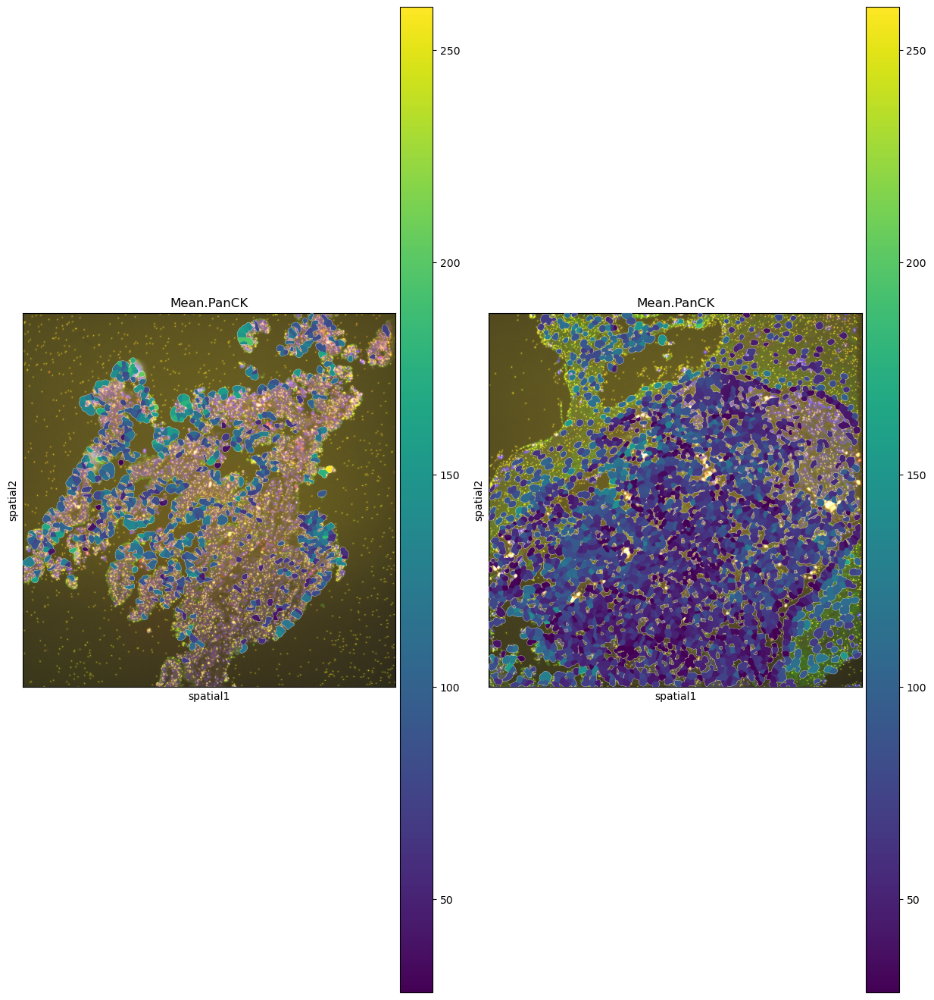

In [21]:
sq.pl.spatial_segment(
    adata,
    color="Mean.PanCK",
    library_key="fov",
    library_id=["1", "11"],
    seg_cell_id="cell_ID",
)

In [28]:
adata.obs["cell_ID"]

4_1           4
8_1           8
14_1         14
16_1         16
17_1         17
           ... 
3804_11    3804
3808_11    3808
3811_11    3811
3814_11    3814
3826_11    3826
Name: cell_ID, Length: 20810, dtype: int64

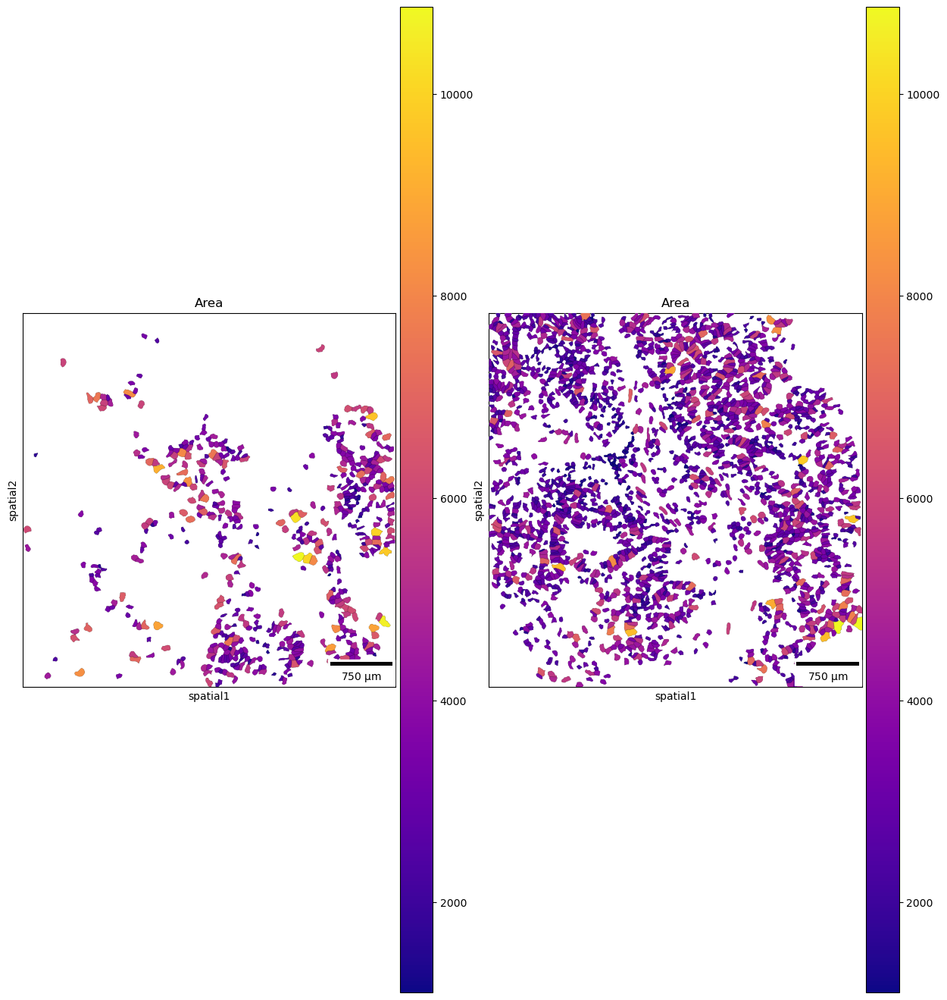

In [22]:
sq.pl.spatial_segment(
    adata,
    color="Area",
    library_key="fov",
    library_id=["2", "3"],
    seg_cell_id="cell_ID",
    seg_outline=True,
    cmap="plasma",
    img=False,
    scalebar_dx=1.0,
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"},
)


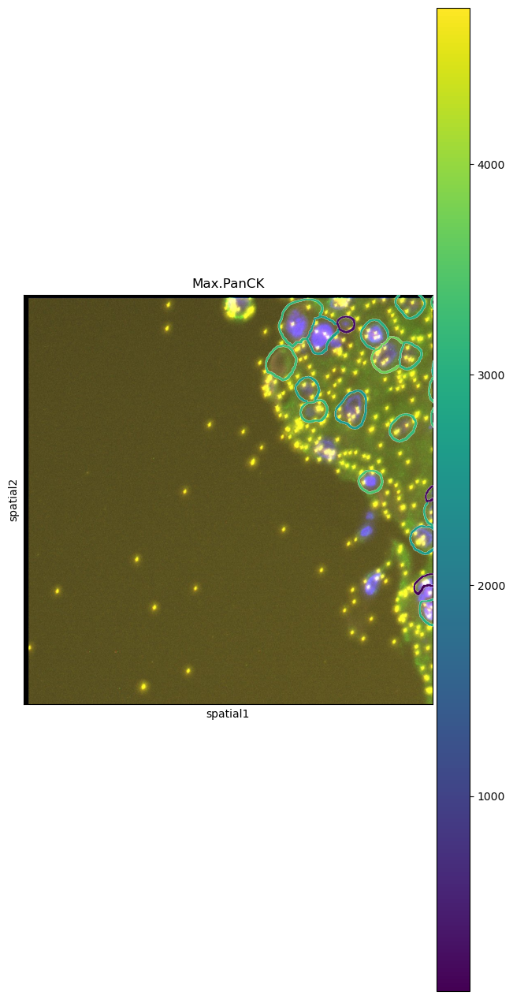

In [25]:
sq.pl.spatial_segment(
    adata,
    color="Max.PanCK",
    library_key="fov",
    library_id="11",
    seg_cell_id="cell_ID",
    seg_contourpx=10,
    crop_coord=[(0, 0, 1000, 1000)],
)

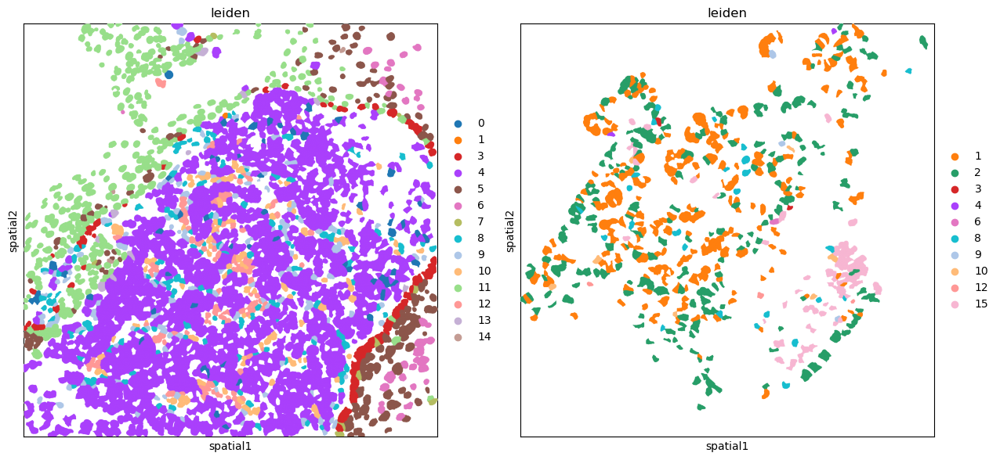

In [27]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
sq.pl.spatial_segment(
    adata,
    shape="hex",
    color="leiden",
    library_key="fov",
    library_id="11",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[0],
)

sq.pl.spatial_segment(
    adata,
    color="leiden",
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="1",
    img=False,
    size=60,
    ax=ax[1],
)

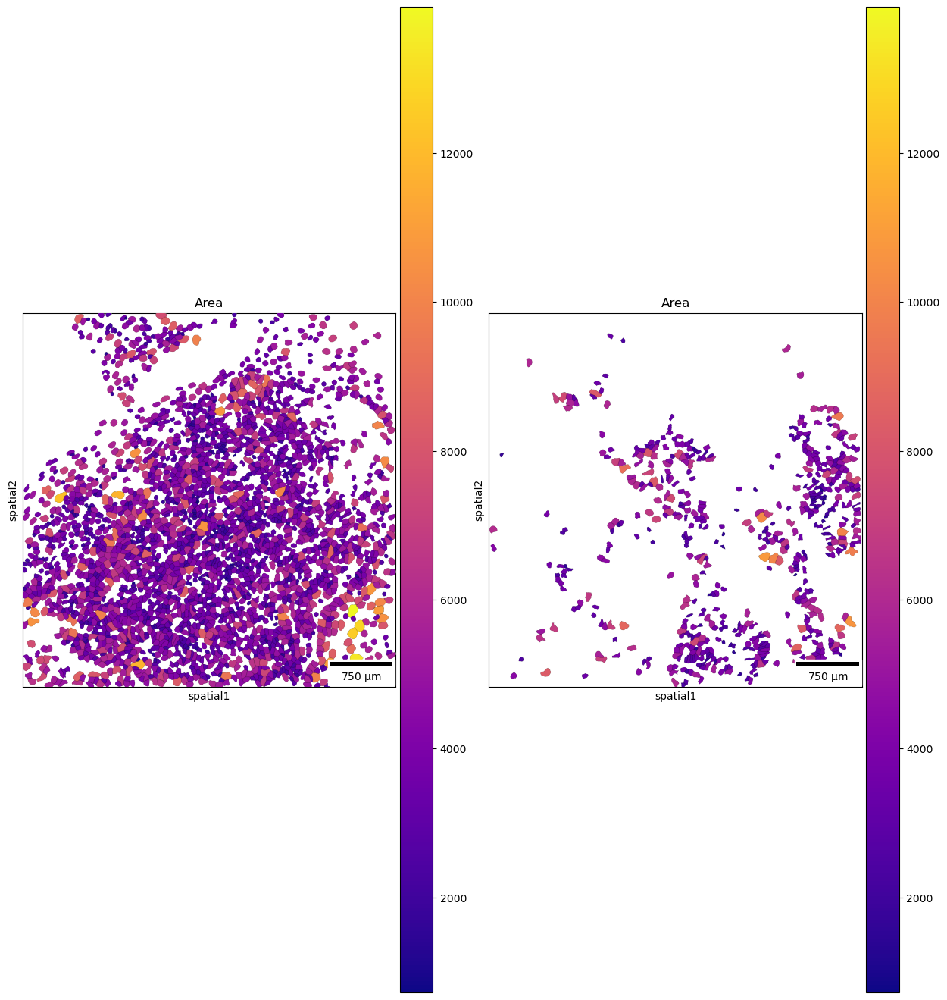

In [38]:
sq.pl.spatial_segment(
    adata,
    color="Area",
    library_key="fov",
    library_id=["11", "2"],
    seg_cell_id="cell_ID",
    seg_outline=True,
    cmap="plasma",
    img=False,
    scalebar_dx=1.0,
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"},
)

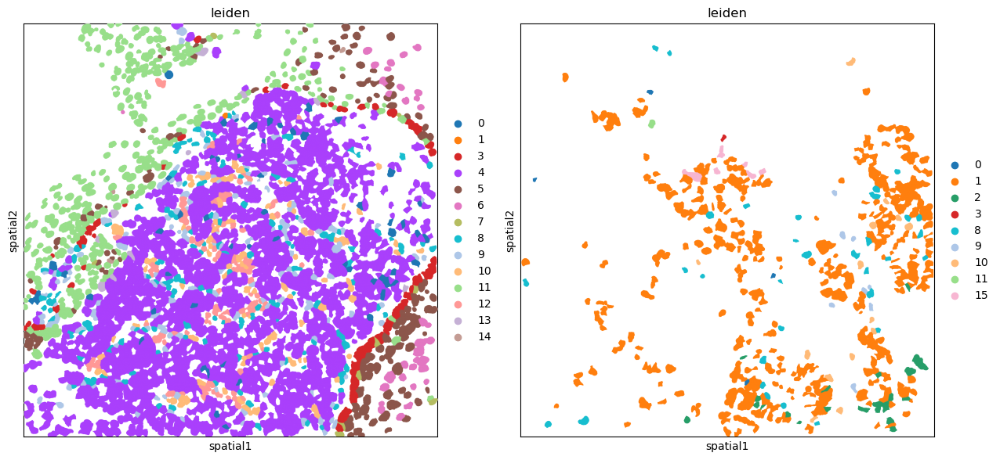

In [39]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
sq.pl.spatial_segment(
    adata,
    shape="hex",
    color="leiden",
    library_key="fov",
    library_id="11",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[0],
)

sq.pl.spatial_segment(
    adata,
    color="leiden",
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="2",
    img=False,
    size=60,
    ax=ax[1],
)


/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:26: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:26: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]


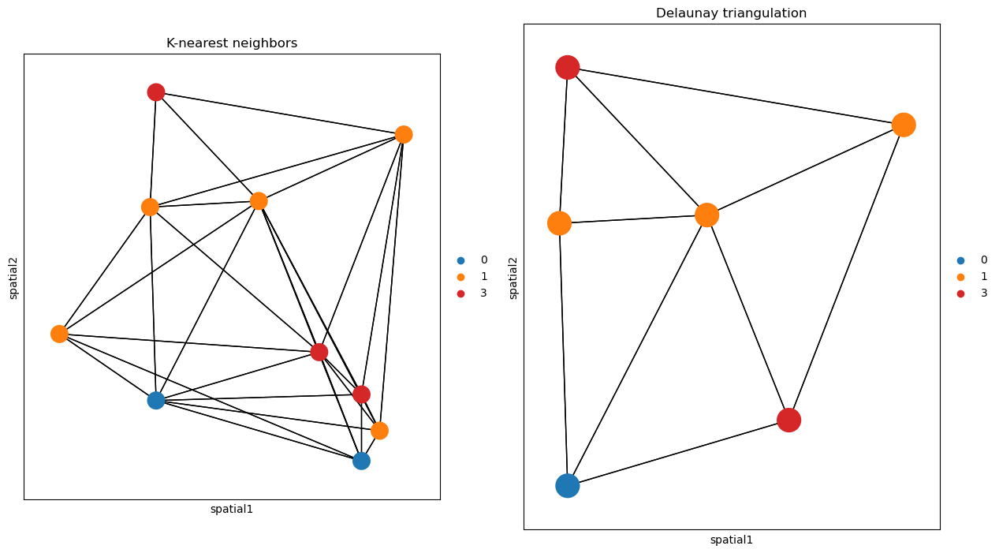

In [41]:
fig, ax = plt.subplots(1, 2, figsize=(15, 15))
sq.gr.spatial_neighbors(
    adata,
    n_neighs=10,
    coord_type="generic",
)
_, idx = adata.obsp["spatial_connectivities"][420, :].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="11",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
    title="K-nearest neighbors",
    ax=ax[0],
)

sq.gr.spatial_neighbors(
    adata,
    n_neighs=10,
    coord_type="generic",
    delaunay=True,
)
_, idx = adata.obsp["spatial_connectivities"][420, :].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="2",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
    title="Delaunay triangulation",
    ax=ax[1],
)

In [42]:
adata.obsp["spatial_connectivities"]

<20810x20810 sparse matrix of type '<class 'numpy.float64'>'
	with 124766 stored elements in Compressed Sparse Row format>

In [43]:
adata.obsp["spatial_distances"]

<20810x20810 sparse matrix of type '<class 'numpy.float64'>'
	with 124766 stored elements in Compressed Sparse Row format>

/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:26: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]


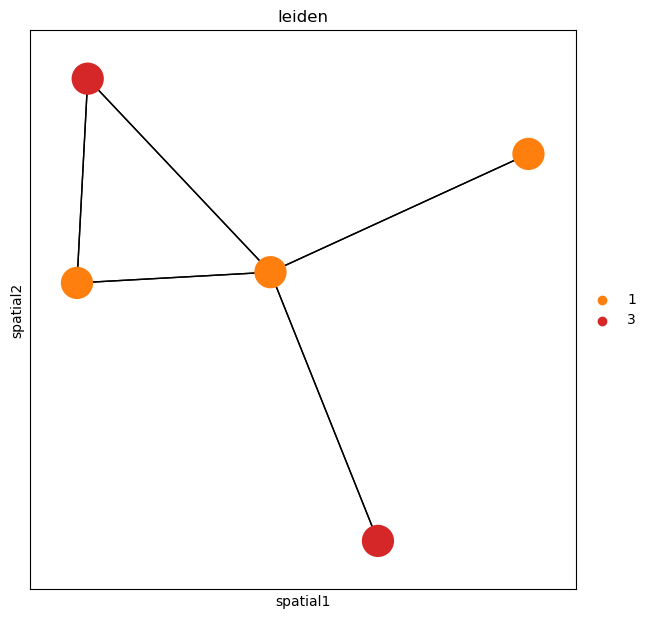

In [44]:
sq.gr.spatial_neighbors(
    adata,
    radius=30,
    coord_type="generic",
)

_, idx = adata.obsp["spatial_connectivities"][420, :].nonzero()
idx = np.append(idx, 420)
sq.pl.spatial_scatter(
    adata[idx, :],
    library_id="11",
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=3,
    edges_width=1,
    edges_color="black",
    img=False,
)

In [45]:
adata.obsp["spatial_connectivities"]
adata.obsp["spatial_distances"]

<20810x20810 sparse matrix of type '<class 'numpy.float64'>'
	with 61736 stored elements in Compressed Sparse Row format>

In [46]:
adata_spatial_neighbor = sq.gr.spatial_neighbors(
    adata, coord_type="generic", delaunay=True
)

In [47]:
sq.gr.centrality_scores(adata, cluster_key="leiden")

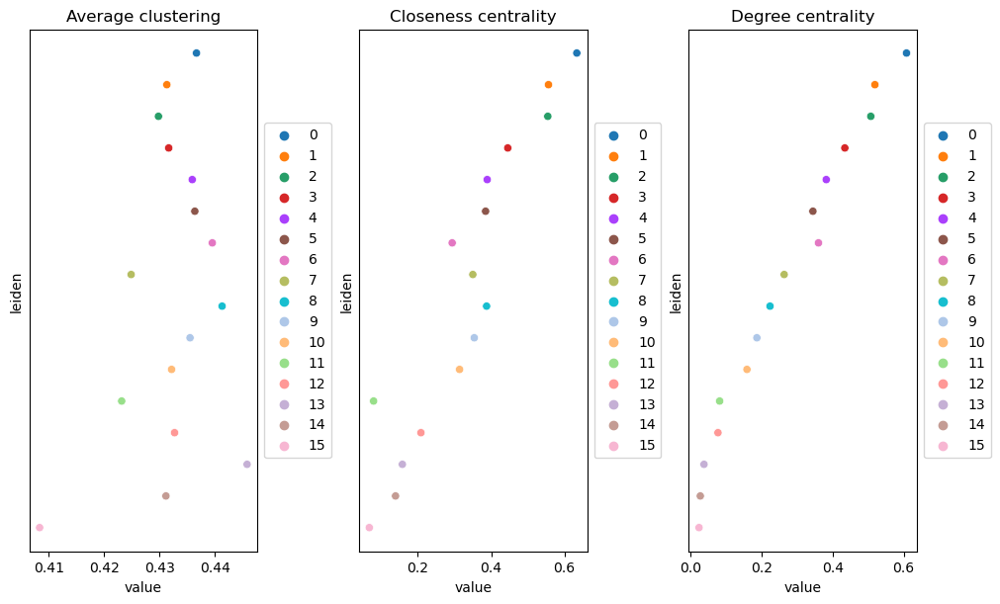

In [48]:
sq.pl.centrality_scores(adata, cluster_key="leiden", figsize=(10, 6))

In [49]:
adata_subset = adata[adata.obs.fov == "11"].copy()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.18/s]


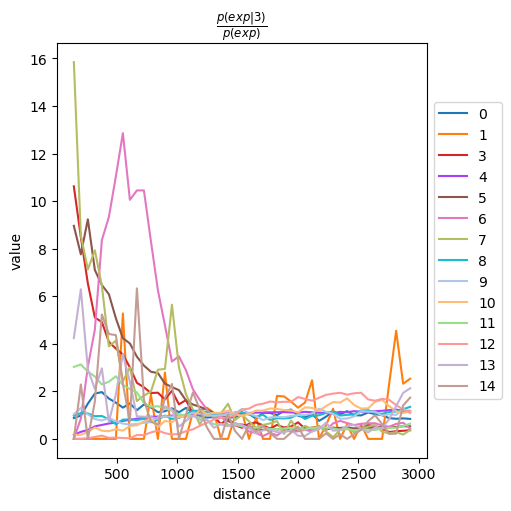

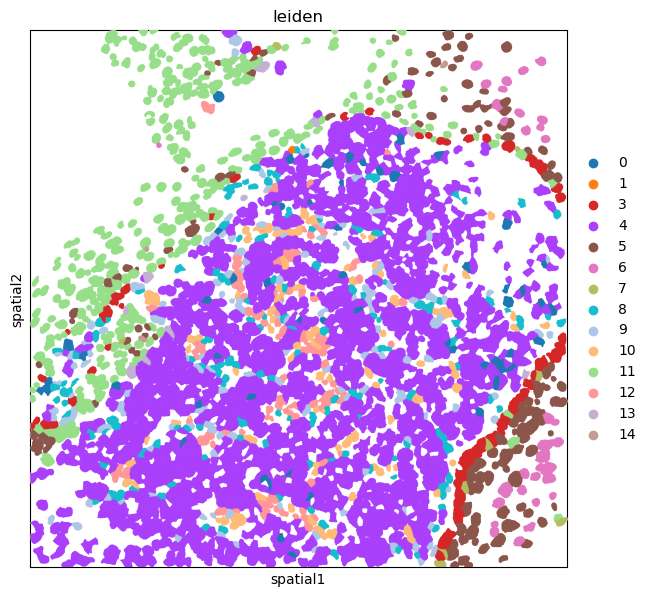

In [51]:
sq.gr.co_occurrence(
    adata_subset,
    cluster_key="leiden",
)
sq.pl.co_occurrence(
    adata_subset,
    cluster_key="leiden",
    clusters="3",
)


sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="11",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
)

In [52]:
sq.gr.nhood_enrichment(adata, cluster_key="leiden")

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 717.95/s]


In [53]:
sq.gr.nhood_enrichment(adata_subset, cluster_key="leiden")

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 3289.36/s]
/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/squidpy/gr/_nhood.py:185: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


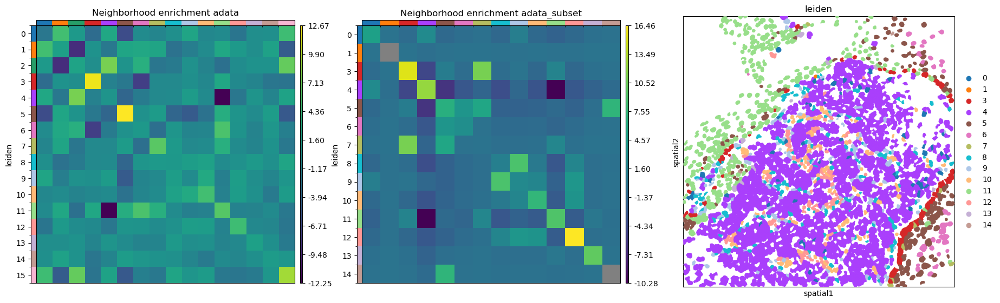

In [55]:
fig, ax = plt.subplots(1, 3, figsize=(22, 22))
sq.pl.nhood_enrichment(
    adata,
    cluster_key="leiden",
    figsize=(3, 3),
    ax=ax[0],
    title="Neighborhood enrichment adata",
)
sq.pl.nhood_enrichment(
    adata_subset,
    cluster_key="leiden",
    figsize=(3, 3),
    ax=ax[1],
    title="Neighborhood enrichment adata_subset",
)
sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="11",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[2],
)

/home/maurizio.aurora/seurat_spatial/lib/python3.9/site-packages/squidpy/pl/_graph.py:317: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.lineplot(y="stats", x="bins", ci="sd", alpha=0.01, color="gray", data=res["sims_stat"], ax=ax)


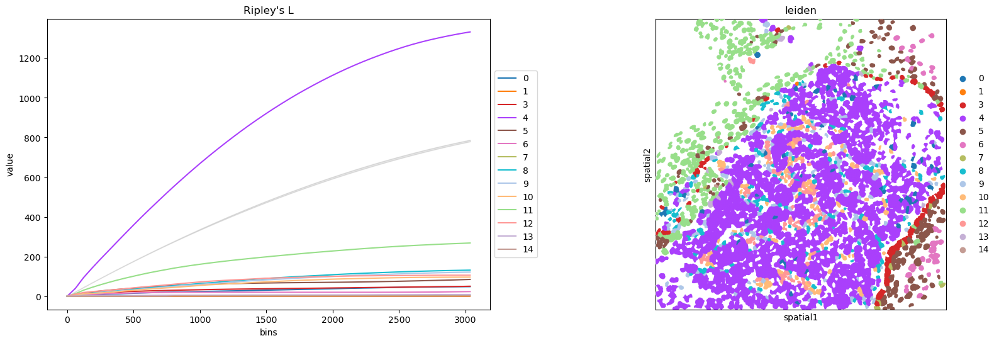

In [56]:
mode = "L"
fig, ax = plt.subplots(1, 2, figsize=(20, 6))

sq.gr.ripley(adata_subset, cluster_key="leiden", mode=mode)
sq.pl.ripley(
    adata_subset,
    cluster_key="leiden",
    mode=mode,
    ax=ax[0],
)

sq.pl.spatial_segment(
    adata_subset,
    shape="hex",
    color="leiden",
    library_id="11",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[1],
)

In [58]:
sq.gr.spatial_neighbors(adata_subset, coord_type="generic", delaunay=True)
sq.gr.spatial_autocorr(
    adata_subset,
    mode="moran",
    n_perms=100,
    n_jobs=1,
)
adata_subset.uns["moranI"].head(10)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [01:37<00:00,  1.03/s]


,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
S100A8,0.827570,0.0,0.000126,0.0,0.009901,0.000278,0.0,0.0,0.022782
KRT6C,0.798448,0.0,0.000126,0.0,0.009901,0.000301,0.0,0.0,0.022782
KRT6A,0.795857,0.0,0.000126,0.0,0.009901,0.000287,0.0,0.0,0.022782
KRT16,0.776467,0.0,0.000126,0.0,0.009901,0.000259,0.0,0.0,0.022782
KRT17,0.776375,0.0,0.000126,0.0,0.009901,0.000257,0.0,0.0,0.022782
KRT6B,0.774440,0.0,0.000126,0.0,0.009901,0.000286,0.0,0.0,0.022782
S100A9,0.768520,0.0,0.000126,0.0,0.009901,0.000322,0.0,0.0,0.022782
KRT14,0.740349,0.0,0.000126,0.0,0.009901,0.000214,0.0,0.0,0.022782
SFN,0.707762,0.0,0.000126,0.0,0.009901,0.000204,0.0,0.0,0.022782
KRT13,0.658982,0.0,0.000126,0.0,0.009901,0.000239,0.0,0.0,0.022782


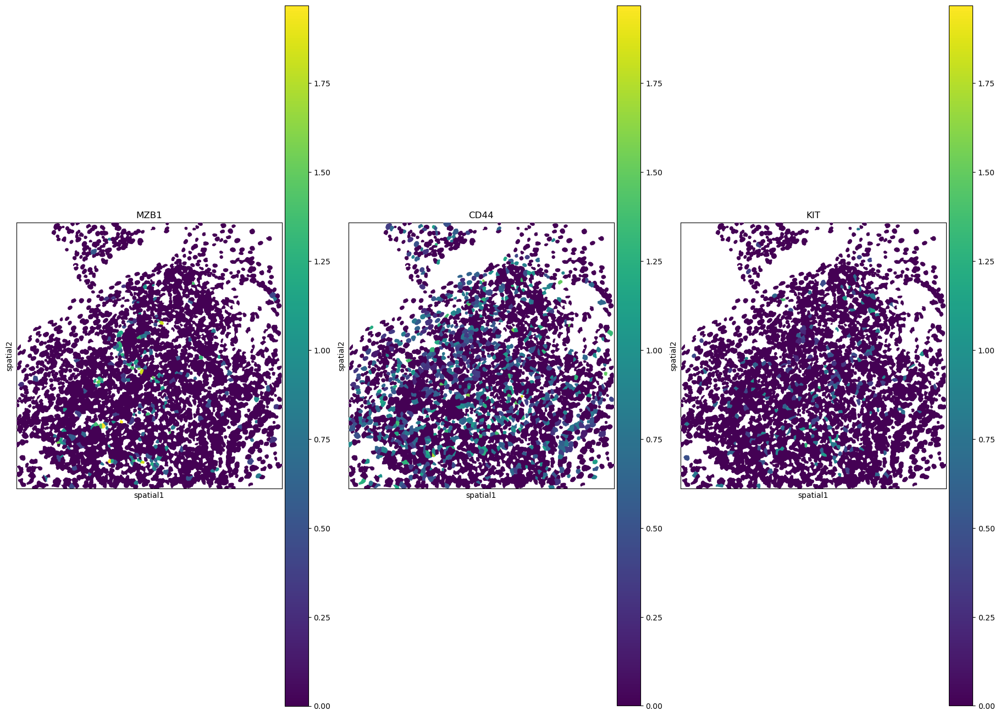

In [67]:
sq.pl.spatial_segment(
    adata_subset,
    library_id="11",
    seg_cell_id="cell_ID",
    library_key="fov",
    color=["MZB1", "CD44", "KIT"],
    size=60,
    img=False,
)